<a href="https://colab.research.google.com/github/kaitlinblakeslee/DS2002F24/blob/main/FinalDSproject.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [11]:
import csv
import sqlite3
import json
import pandas as pd
import requests

birthdeath = pd.read_csv('births-and-deaths-projected-to-2100.csv')

#print(birthdeath.head())

rows, columns = birthdeath.shape

print("Number of rows:", rows)
print("Number of columns:", columns)







Number of rows: 38656
Number of columns: 7


In [12]:
# ETL Implementation

birthdeath = birthdeath.rename(columns={
    'Deaths - Sex: all - Age: all - Variant: estimates': 'Deaths Estimate',
    'Deaths - Sex: all - Age: all - Variant: medium': 'Deaths Medium',
    'Births - Sex: all - Age: all - Variant: estimates': 'Births Estimate',
    'Births - Sex: all - Age: all - Variant: medium': 'Births Medium'
})

birthdeath.rename(columns={'Entity': 'Country'}, inplace=True)

# Combine Deaths and Births columns
birthdeath['Deaths'] = birthdeath['Deaths Estimate'].combine_first(birthdeath['Deaths Medium'])
birthdeath['Births'] = birthdeath['Births Estimate'].combine_first(birthdeath['Births Medium'])

# Drop original columns
birthdeath = birthdeath.drop(columns=['Deaths Estimate', 'Deaths Medium', 'Births Estimate', 'Births Medium'])

# Melt the DataFrame to create a long format
birthdeath_melted = pd.melt(birthdeath, id_vars=['Country', 'Code', 'Year'],
                            value_vars=['Deaths', 'Births'],
                            var_name='Variable', value_name='Value')

# Pivot the DataFrame to achieve the desired structure
cleaned_birthdeath = birthdeath_melted.pivot_table(
    index=['Country', 'Code'],
    columns=['Year', 'Variable'],
    values='Value'
).reset_index()

# Flatten the MultiIndex columns
cleaned_birthdeath.columns = [f'{col[1]}_{col[0]}' if col[1] else col[0] for col in cleaned_birthdeath.columns]

# Save the cleaned DataFrame to CSV
cleaned_birthdeath.to_csv('cleaned_birthdeath.csv', index=False)

print(cleaned_birthdeath.head())

          Country Code  Births_1950    Deaths_1950  Births_1951  \
0     Afghanistan  AFG     383985.0  290972.000000     391002.0   
1         Albania  ALB      49038.0   29043.000000      50620.0   
2         Algeria  DZA     456352.0  203871.000000     466128.0   
3  American Samoa  ASM        845.0     189.000020        868.0   
4         Andorra  AND         92.0      62.000004         98.0   

     Deaths_1951  Births_1952    Deaths_1952  Births_1953    Deaths_1953  ...  \
0  288752.000000     397663.0  288059.000000     404666.0  287712.000000  ...   
1   28978.000000      52059.0   28827.000000      54672.0   28918.000000  ...   
2  207930.000000     475687.0  212635.000000     486150.0  216943.000000  ...   
3     184.000000        858.0     178.000000        847.0     173.000020  ...   
4      60.000004         92.0      60.000004         89.0      59.000004  ...   

   Births_2096   Deaths_2096  Births_2097   Deaths_2097  Births_2098  \
0    1834483.0  1.099780e+06    182942

In [14]:
carbondata = pd.read_csv('CO2_emission.csv')

# Rename year columns in carbondata
carbon_years = [str(year) for year in range(1990, 2020)]  # List of year columns (1990-2019)
rename_dict = {year: f"carbon_{year}" for year in carbon_years}  # Create renaming dictionary

# Apply the renaming
carbondata.rename(columns=rename_dict, inplace=True)

# Print the updated DataFrame to verify
print(carbondata.head())

  Country Name country_code                     Region  \
0        Aruba          ABW  Latin America & Caribbean   
1  Afghanistan          AFG                 South Asia   
2       Angola          AGO         Sub-Saharan Africa   
3      Albania          ALB      Europe & Central Asia   
4      Andorra          AND      Europe & Central Asia   

                           Indicator Name  carbon_1990  carbon_1991  \
0  CO2 emissions (metric tons per capita)          NaN          NaN   
1  CO2 emissions (metric tons per capita)     0.191745     0.167682   
2  CO2 emissions (metric tons per capita)     0.553662     0.544539   
3  CO2 emissions (metric tons per capita)     1.819542     1.242810   
4  CO2 emissions (metric tons per capita)     7.521832     7.235379   

   carbon_1992  carbon_1993  carbon_1994  carbon_1995  ...  carbon_2011  \
0          NaN          NaN          NaN          NaN  ...          NaN   
1     0.095958     0.084721     0.075546     0.068468  ...     0.296506   

In [15]:
carbondata = pd.read_csv('CO2_emission.csv')
#print(carbondata)

rows, columns = carbondata.shape

#print("Number of rows:", rows)
#print("Number of columns:", columns)

carbondata = carbondata.dropna()

carbondata.rename(columns={'Country Name': 'Country'}, inplace=True)

carbondata = carbondata.drop(columns=['Indicator Name'])

carbondata.to_csv('cleaned_carbondata.csv', index=False)

In [16]:
!pip install fuzzywuzzy[speedup]
!pip install python-Levenshtein

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 162.6/162.6 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 46.5 MB/s eta 0:00:00


In [17]:
from fuzzywuzzy import process

def match_country_names(country, reference_list):
    match, score = process.extractOne(country, reference_list)
    return match if score > 80 else country

# Standardize country names
carbon_countries = carbondata['Country'].unique()
cleaned_birthdeath['Country'] = cleaned_birthdeath['Country'].apply(
    lambda x: match_country_names(x, carbon_countries)
)


In [18]:
# Merge datasets on 'Country'
merged_data = pd.merge(
    cleaned_birthdeath,
    carbondata,
    on='Country',
    how='inner'
)

# Save merged dataset to CSV
merged_data.to_csv('final_cleaned_data.csv', index=False)

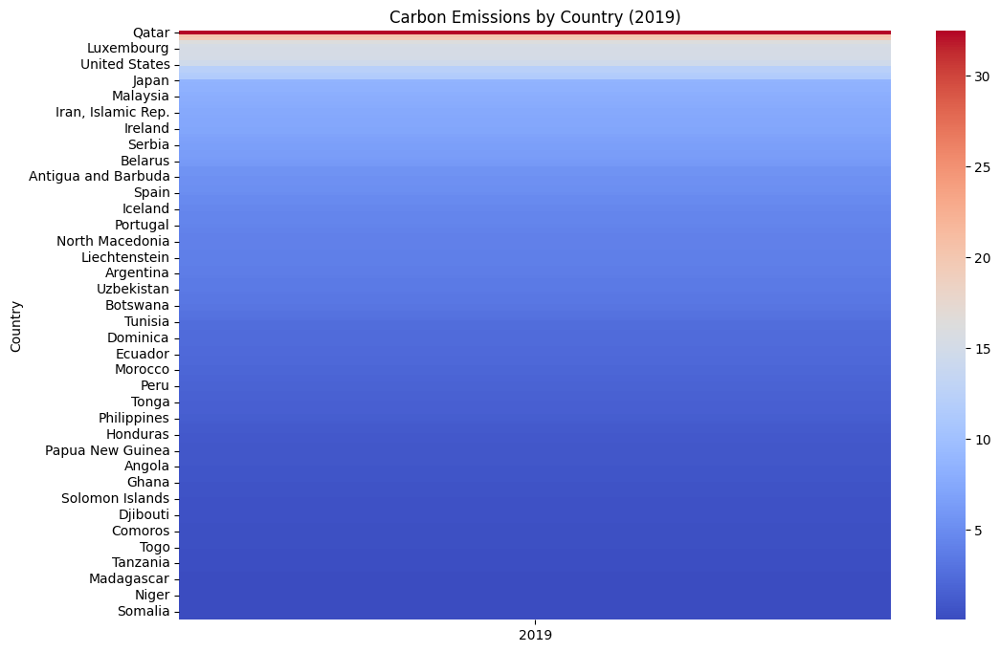

In [21]:
import seaborn as sns

# Example: Heatmap for emissions in 2019
emissions_2019 = merged_data[['Country', '2019']].set_index('Country')
plt.figure(figsize=(12, 8))
sns.heatmap(emissions_2019.sort_values('2019', ascending=False), cmap='coolwarm', annot=False)
plt.title('Carbon Emissions by Country (2019)')
plt.show()

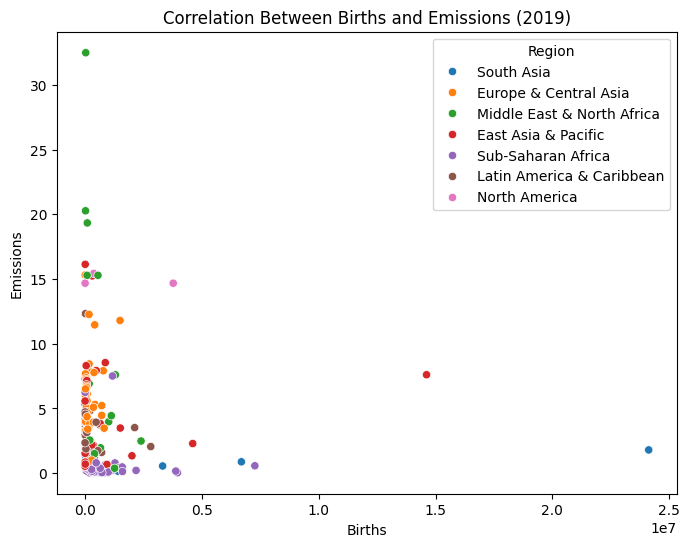

In [22]:
import seaborn as sns

# Example: Emissions vs. Births for 2019
plt.figure(figsize=(8, 6))
sns.scatterplot(data=merged_data, x='Births_2019', y='2019', hue='Region')
plt.title('Correlation Between Births and Emissions (2019)')
plt.xlabel('Births')
plt.ylabel('Emissions')
plt.show()

In [19]:
# Data Analysis
import pandas as pd
import matplotlib.pyplot as plt

# Load the dataset
carbondata = pd.read_csv('cleaned_carbondata.csv')

# Melt the dataset to restructure year columns into rows
carbondata_melted = carbondata.melt(
    id_vars=['Country Name', 'country_code', 'Region'],
    var_name='Year',
    value_name='Value'
)

# Convert 'Year' to numeric (for proper sorting) and drop rows with missing values
carbondata_melted['Year'] = pd.to_numeric(carbondata_melted['Year'], errors='coerce')
carbondata_melted = carbondata_melted.dropna(subset=['Year', 'Value'])

# Example: Aggregate the data by Region and Year (sum of 'Value')
region_year_data = carbondata_melted.groupby(['Year', 'Region'])['Value'].sum().unstack(fill_value=0)

# Plotting trends by region
plt.figure(figsize=(12, 7))

for region in region_year_data.columns:
    plt.plot(region_year_data.index, region_year_data[region], label=region)

# Customize the plot
plt.title('Carbon Trends by Region Over Years', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Value', fontsize=14)
plt.legend(title="Region", loc='upper left', fontsize=10)
plt.grid(alpha=0.3)

# Show the plot
plt.show()

KeyError: "The following id_vars or value_vars are not present in the DataFrame: ['Country Name']"

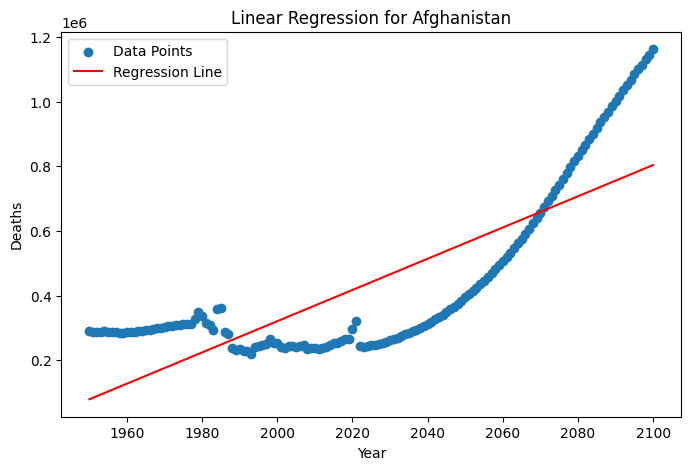

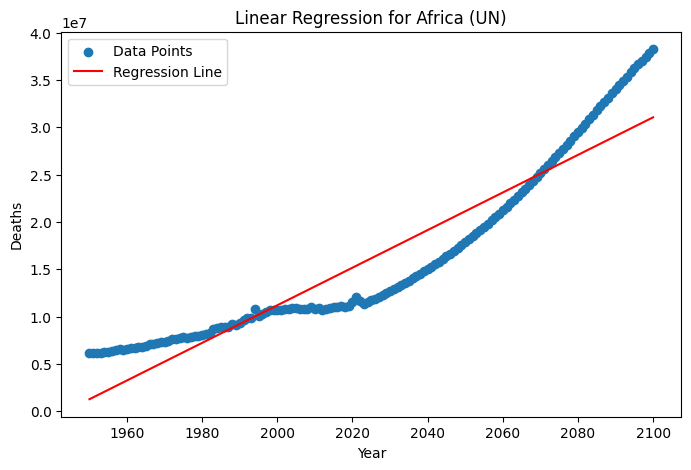

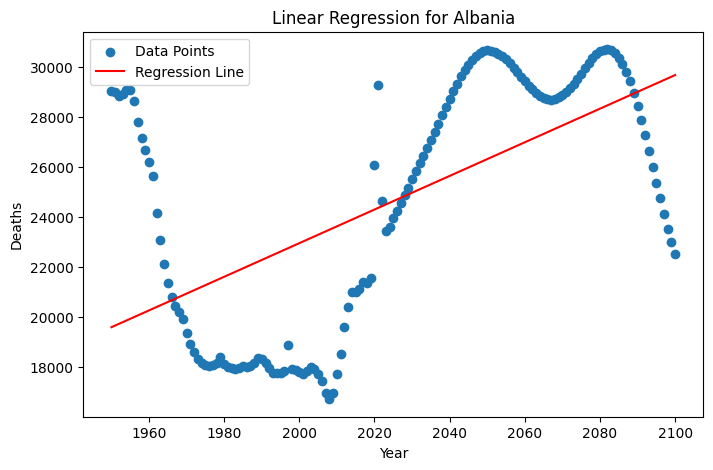

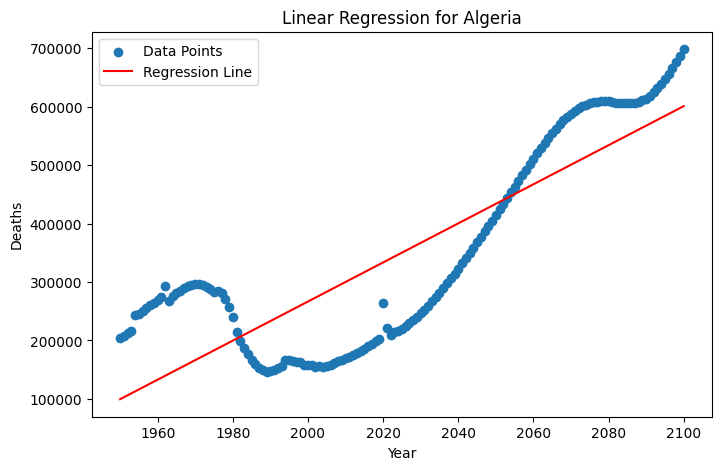

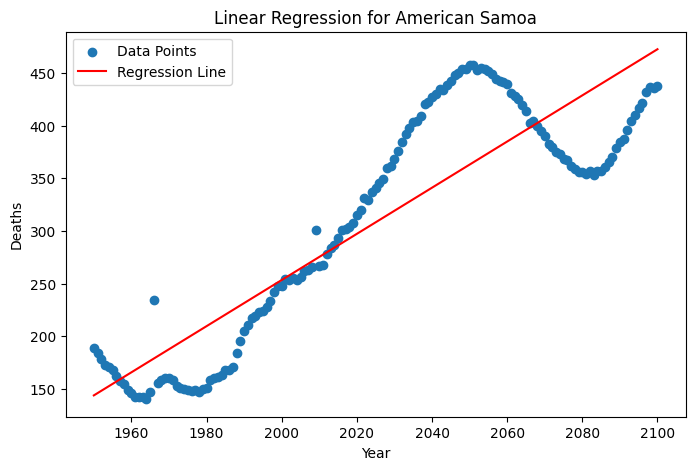

...

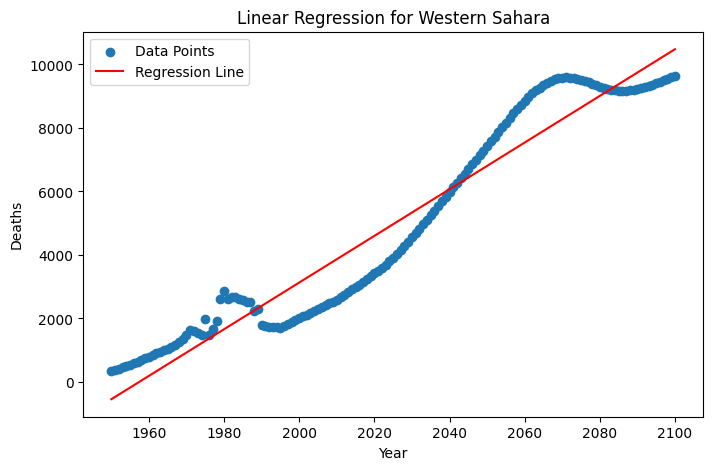

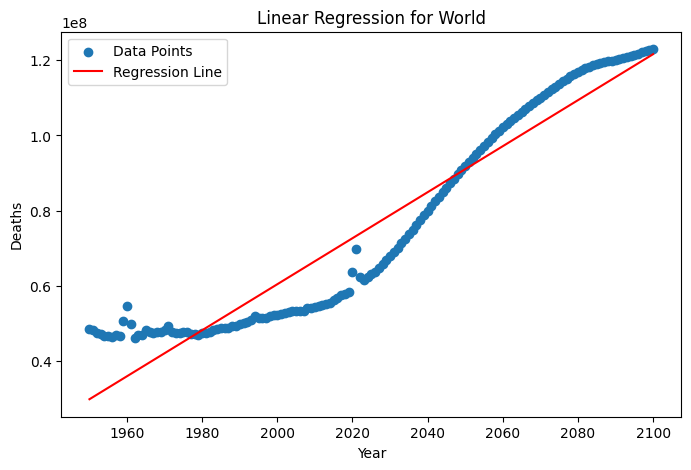

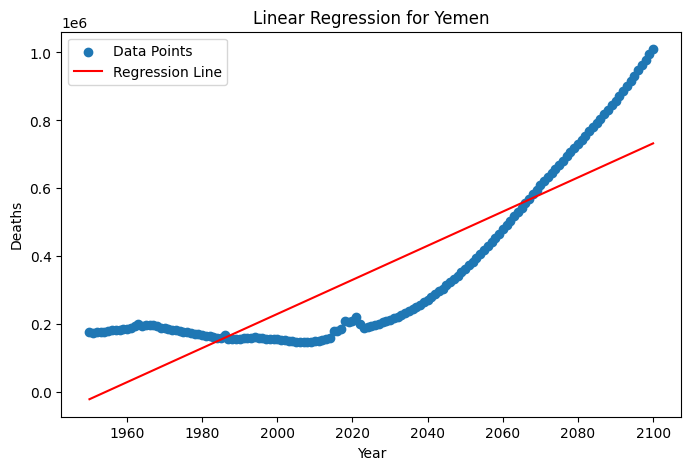

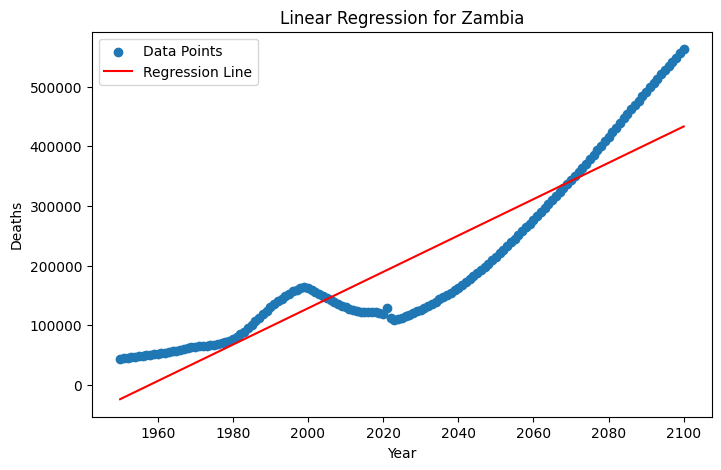

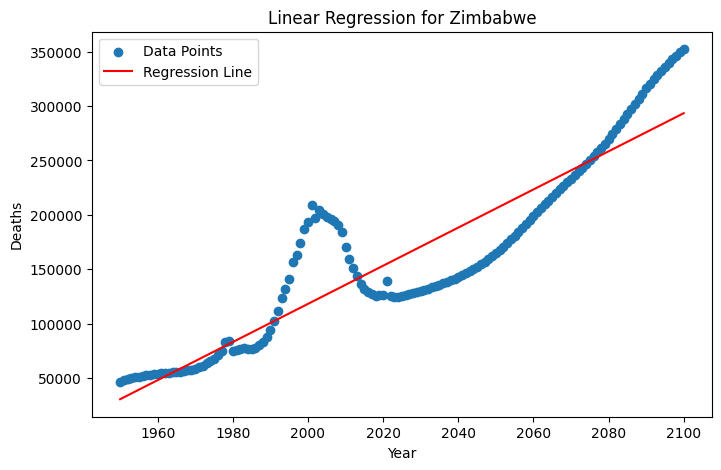

In [ ]:
# Import Matplotlib and NumPy
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Assuming 'birthdeath' is a DataFrame with columns: 'Country', 'Year', 'Deaths'

# List of unique countries in the dataset
countries = birthdeath['Entity'].unique()

# Loop through each country and generate the plot
for country in countries:
    # Filter data for the current country
    country_data = birthdeath[birthdeath['Entity'] == country]

    # Extract 'Year' and 'Deaths' columns
    x = country_data['Year'].values
    y = country_data['Deaths'].values

    # Skip if there's insufficient data for regression
    if len(x) < 2:
        print(f"Skipping {country} due to insufficient data.")
        continue

    # Calculate linear regression using NumPy
    slope, intercept = np.polyfit(x, y, 1)  # 1 for linear regression

    # Create regression line data
    regression_line = slope * x + intercept

    # Create the plot
    plt.figure(figsize=(8, 5))
    plt.scatter(x, y, label='Data Points')  # Scatter plot of original data
    plt.plot(x, regression_line, color='red', label='Regression Line')  # Regression line
    plt.title(f'Linear Regression for {country}')
    plt.xlabel('Year')
    plt.ylabel('Deaths')
    plt.legend()
    plt.show()

In [ ]:
import pandas as pd
import plotly.express as px

# Merge datasets on 'Country' and 'Year'
merged_data = pd.merge(carbon_long, birthdeath, on=['Country', 'Year'], how='inner')

# Create an interactive scatter plot
fig = px.scatter(
    merged_data,
    x='Carbon',  # X-axis: carbon emissions
    y='Deaths',  # Y-axis: number of deaths
    animation_frame='Year',  # Animation based on year
    animation_group='Country',  # Group animation by country
    size='Carbon',  # Size of bubbles
    color='Country',  # Color by country
    hover_name='Country',  # Show country names on hover
    title='Interactive Scatter Plot: Carbon Emissions vs Deaths Over Years',
    labels={'Carbon': 'Carbon Emissions', 'Deaths': 'Deaths'},  # Axis labels
    height=600,
    width=800
)

# Customize layout (optional)
fig.update_layout(
    xaxis=dict(title='Carbon Emissions'),
    yaxis=dict(title='Number of Deaths'),
    showlegend=True
)

# Display the plot
fig.show()
